In [7]:
import torch
from diffusers.models import MotionAdapter
from diffusers import AnimateDiffSDXLPipeline, DDIMScheduler
from diffusers.utils import export_to_gif, export_to_video
import os

adapter = MotionAdapter.from_pretrained("guoyww/animatediff-motion-adapter-sdxl-beta", torch_dtype=torch.float16)

model_id = "stabilityai/stable-diffusion-xl-base-1.0"
scheduler = DDIMScheduler.from_pretrained(
    model_id,
    subfolder="scheduler",
    clip_sample=False,
    timestep_spacing="linspace",
    beta_schedule="linear",
    steps_offset=1,
)
pipe = AnimateDiffSDXLPipeline.from_pretrained(
    model_id,
    motion_adapter=adapter,
    scheduler=scheduler,
    torch_dtype=torch.float16,
    variant="fp16",
).to("cuda")

# enable memory savings
pipe.enable_vae_slicing()
pipe.enable_vae_tiling()

output = pipe(
    prompt="a panda surfing in the ocean, realistic, high quality",
    negative_prompt="low quality, worst quality",
    num_inference_steps=20,
    guidance_scale=8,
    width=1024,
    height=1024,
    num_frames=16,
    generator=torch.Generator("cpu").manual_seed(42)    
)

frames = output.frames[0]
output_path = "generated/03_t2v_sdxl"
os.makedirs(os.path.dirname(output_path), exist_ok=True)
export_to_video(frames, output_path+".mp4")
export_to_gif(frames, output_path+".gif")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'center_input_sample': False, 'flip_sin_to_cos': True, 'freq_shift': 0, 'mid_block_type': 'UNetMidBlock2DCrossAttn', 'only_cross_attention': False, 'attention_head_dim': [5, 10, 20], 'dual_cross_attention': False, 'class_embed_type': None, 'num_class_embeds': None, 'upcast_attention': None, 'resnet_time_scale_shift': 'default', 'resnet_skip_time_act': False, 'resnet_out_scale_factor': 1.0, 'time_embedding_type': 'positional', 'time_embedding_dim': None, 'time_embedding_act_fn': None, 'timestep_post_act': None, 'conv_in_kernel': 3, 'conv_out_kernel': 3, 'class_embeddings_concat': False, 'mid_block_only_cross_attention': None, 'cross_attention_norm': None, 'addition_embed_type_num_heads': 64} were passed to UNetMotionModel, but are not expected and will be ignored. Please verify your config.json configuration file.


  0%|          | 0/20 [00:00<?, ?it/s]

'generated/03_t2v_sdxl.gif'

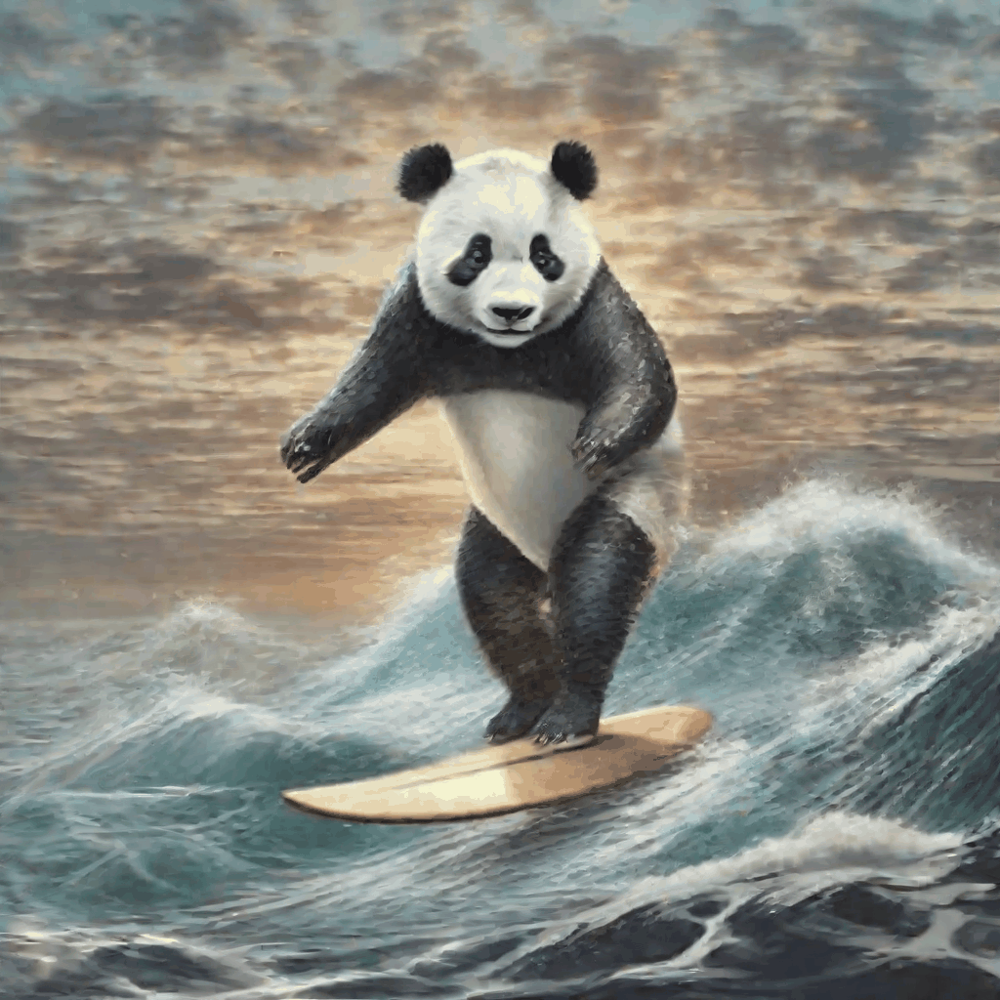

In [8]:
from IPython.display import Image

Image(output_path+".gif")

In [ ]:
## 18.8GB